## Intalling dependencies

In [ ]:
!pip install tflite_model_maker

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 642 kB 13.5 MB/s 
     |████████████████████████████████| 10.9 MB 22.9 MB/s 
     |████████████████████████████████| 87 kB 4.0 MB/s 
     |████████████████████████████████| 1.1 MB 31.1 MB/s 
     |████████████████████████████████| 120 kB 60.4 MB/s 
     |████████████████████████████████| 237 kB 63.8 MB/s 
     |████████████████████████████████| 6.4 MB 21.9 MB/s 
     |████████████████████████████████| 1.2 MB 42.6 MB/s 
     |████████████████████████████████| 840 kB 45.8 MB/s 
     |████████████████████████████████| 596 kB 57.6 MB/s 
     |████████████████████████████████| 42.5 MB 1.3 MB/s 
     |████████████████████████████████| 3.4 MB 33.5 MB/s 
     |████████████████████████████████| 77 kB 2.4 MB/s 
     |████████████████████████████████| 25.3 MB 3.8 MB/s 
     |████████████████████████████████| 352 kB 49.4 MB/s 
     |████████████████████████████

In [ ]:
!sudo apt-get install libportaudio2
!pip install sounddevice

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following NEW packages will be installed:
  libportaudio2
0 upgraded, 1 newly installed, 0 to remove and 42 not upgraded.
Need to get 64.6 kB of archives.
After this operation, 215 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libportaudio2 amd64 19.6.0-1 [64.6 kB]
Fetched 64.6 kB in 0s (1,087 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletyp

# Import TensorFlow, Model Maker and other libraries

In [ ]:
import tensorflow as tf
import tflite_model_maker as mm
from tflite_model_maker import audio_classifier
import os
import zipfile

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import itertools
import glob
import random

from IPython.display import Audio, Image
from scipy.io import wavfile

print(f"TensorFlow Version: {tf.__version__}")
print(f"Model Maker Version: {mm.__version__}")

TensorFlow Version: 2.8.0
Model Maker Version: 0.4.0


## The Birds dataset

In [ ]:
birds_dataset_folder = tf.keras.utils.get_file('birds_dataset.zip',
                                                'https://storage.googleapis.com/laurencemoroney-blog.appspot.com/birds_dataset.zip',
                                                cache_dir='./',
                                                cache_subdir='dataset',
                                                extract=True)

343695360/343680986 [==============================] - 5s 0us/step


# Read dataset

In [ ]:
df = pd.read_csv('/content/dataset/small_birds_dataset/metadata.csv')
df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,date,filename,license,rating,time,url,duration,split
0,azaspi1,[],['song'],8.7171,-71.33040,Synallaxis azarae,Azara's Spinetail,Joe Klaiber,0000-00-00,XC219896.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,00:00,https://www.xeno-canto.org/219896,9.682,train
1,azaspi1,[],['song'],-0.4400,-77.86240,Synallaxis azarae,Azara's Spinetail,GABRIEL LEITE,2014-07-11,XC186641.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,11:00,https://www.xeno-canto.org/186641,12.304,train
2,azaspi1,[],['song'],-17.1528,-65.90840,Synallaxis azarae,Azara's Spinetail,Sjoerd Mayer,1992-08-28,XC1596.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,?,https://www.xeno-canto.org/1596,12.862,train
3,azaspi1,[],['song'],-4.6476,-79.74426,Synallaxis azarae,Azara's Spinetail,Willem-Pier Vellinga,2000-07-00,XC746.wav,Creative Commons Attribution-NonCommercial-Sha...,4.5,?:?,https://www.xeno-canto.org/746,14.358,test
4,azaspi1,[],['song'],1.6564,-76.18300,Synallaxis azarae,Azara's Spinetail,David Bradley,2015-12-26,XC298616.wav,Creative Commons Attribution-NonCommercial-Sha...,5.0,06:00,https://www.xeno-canto.org/298616,14.780,train


In [ ]:
df.shape

(294, 16)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294 entries, 0 to 293
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   primary_label     294 non-null    object 
 1   secondary_labels  294 non-null    object 
 2   type              294 non-null    object 
 3   latitude          294 non-null    float64
 4   longitude         294 non-null    float64
 5   scientific_name   294 non-null    object 
 6   common_name       294 non-null    object 
 7   author            294 non-null    object 
 8   date              294 non-null    object 
 9   filename          294 non-null    object 
 10  license           294 non-null    object 
 11  rating            294 non-null    float64
 12  time              294 non-null    object 
 13  url               294 non-null    object 
 14  duration          294 non-null    float64
 15  split             294 non-null    object 
dtypes: float64(4), object(12)
memory usage: 36.9

# Explore the data

In [ ]:

data_dir = './dataset/small_birds_dataset'

bird_code_to_name = {
  'wbwwre1': 'White-breasted Wood-Wren',
  'houspa': 'House Sparrow',
  'redcro': 'Red Crossbill',  
  'chcant2': 'Chestnut-crowned Antpitta',
  'azaspi1': "Azara's Spinetail",   
}

birds_images = {
  'wbwwre1': 'https://upload.wikimedia.org/wikipedia/commons/thumb/2/22/Henicorhina_leucosticta_%28Cucarachero_pechiblanco%29_-_Juvenil_%2814037225664%29.jpg/640px-Henicorhina_leucosticta_%28Cucarachero_pechiblanco%29_-_Juvenil_%2814037225664%29.jpg',      #Alejandro Bayer Tamayo from Armenia, Colombia 
  'houspa': 'https://upload.wikimedia.org/wikipedia/commons/thumb/5/52/House_Sparrow%2C_England_-_May_09.jpg/571px-House_Sparrow%2C_England_-_May_09.jpg',                          #Diliff
  'redcro': 'https://upload.wikimedia.org/wikipedia/commons/thumb/4/49/Red_Crossbills_%28Male%29.jpg/640px-Red_Crossbills_%28Male%29.jpg',                                            #Elaine R. Wilson, www.naturespicsonline.com
  'chcant2': 'https://upload.wikimedia.org/wikipedia/commons/thumb/6/67/Chestnut-crowned_antpitta_%2846933264335%29.jpg/640px-Chestnut-crowned_antpitta_%2846933264335%29.jpg',                     #Mike's Birds from Riverside, CA, US
  'azaspi1': 'https://upload.wikimedia.org/wikipedia/commons/thumb/b/b2/Synallaxis_azarae_76608368.jpg/640px-Synallaxis_azarae_76608368.jpg',                                         #https://www.inaturalist.org/photos/76608368
}

test_files = os.path.join('/content', data_dir, 'test/*/*.wav')


# Playing some audio

In [ ]:
def get_random_audio_file():
  test_list = glob.glob(test_files)
  random_audio_path = random.choice(test_list)
  return random_audio_path

# Training the Model

In [ ]:
def show_bird_data(audio_path):
  sample_rate, audio_data = wavfile.read(audio_path, 'rb')

  bird_code = audio_path.split('/')[-2]
  print(f'Bird name: {bird_code_to_name[bird_code]}')
  print(f'Bird code: {bird_code}')
  display(Image(birds_images[bird_code]))

  plttitle = f'{bird_code_to_name[bird_code]} ({bird_code})'
  plt.title(plttitle)
  plt.plot(audio_data)
  display(Audio(audio_data, rate=sample_rate))

print('functions and data structures created')

functions and data structures created


Bird name: Red Crossbill
Bird code: redcro


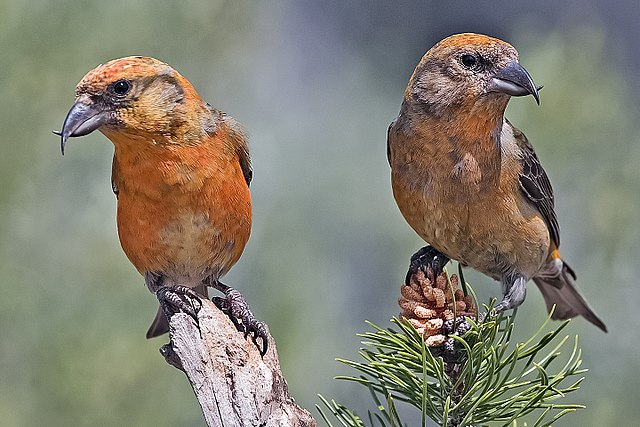

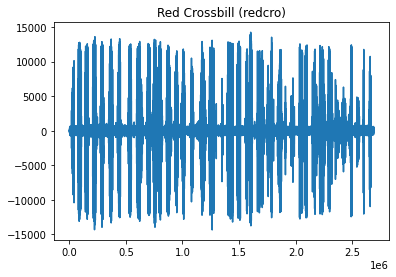

In [ ]:
random_audio = get_random_audio_file()
show_bird_data(random_audio)

# Training the Model

In [ ]:
spec = audio_classifier.YamNetSpec(
    keep_yamnet_and_custom_heads=True,
    frame_step=3 * audio_classifier.YamNetSpec.EXPECTED_WAVEFORM_LENGTH,
    frame_length=6 * audio_classifier.YamNetSpec.EXPECTED_WAVEFORM_LENGTH)

INFO:tensorflow:Checkpoints are stored in /tmp/tmp1yh7uisc


# Loading the data

In [ ]:
train_data = audio_classifier.DataLoader.from_folder(spec, os.path.join(data_dir, 'train'), cache=True)
train_data, validation_data = train_data.split(0.8)
test_data = audio_classifier.DataLoader.from_folder(spec, os.path.join(data_dir, 'test'), cache=True)

## Training the model

In [ ]:
print('Training the model')
model = audio_classifier.create(train_data,spec,validation_data,batch_size=128,epochs=50)

Training the model


The accuracy looks good but it's important to run the evaluation step on the test data and vefify your model achieved good results on unseed data.

In [ ]:
print('Evaluating the model')
model.evaluate(test_data)

# Understanding your model

In [ ]:
def show_confusion_matrix(confusion, test_labels):
  
  """Compute confusion matrix and normalize."""

  confusion_normalized = confusion.astype("float") / confusion.sum(axis=1)
  axis_labels = test_labels
  ax = sns.heatmap(confusion_normalized, xticklabels=axis_labels, yticklabels=axis_labels,cmap='Blues', annot=True, fmt='.2f', square=True)
  plt.title("Confusion matrix")
  plt.ylabel("True label")
  plt.xlabel("Predicted label")

In [ ]:
confusion_matrix = model.confusion_matrix(test_data)
show_confusion_matrix(confusion_matrix.numpy(), test_data.index_to_label)

# Testing the model [Optional]

In [ ]:
serving_model = model.create_serving_model()

print(f'Model\'s input shape and type: {serving_model.inputs}')
print(f'Model\'s output shape and type: {serving_model.outputs}')

Bird name: House Sparrow
Bird code: houspa


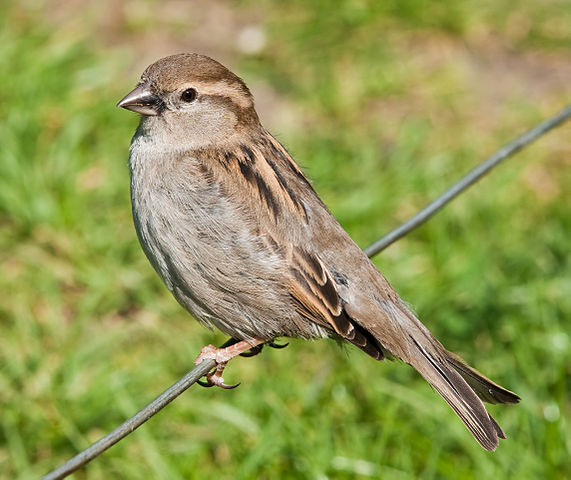

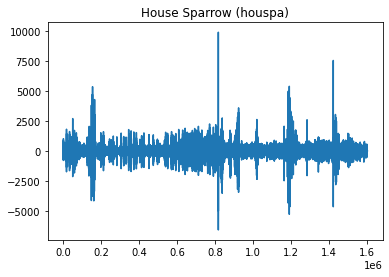

In [ ]:
# if you want to try another file just uncoment the line below
random_audio = get_random_audio_file()
show_bird_data(random_audio)

In [ ]:
sample_rate, audio_data = wavfile.read(random_audio, 'rb')

audio_data = np.array(audio_data) / tf.int16.max
input_size = serving_model.input_shape[1]

splitted_audio_data = tf.signal.frame(audio_data, input_size, input_size, pad_end=True, pad_value=0)

print(f'Test audio path: {random_audio}')
print(f'Original size of the audio data: {len(audio_data)}')
print(f'Number of windows for inference: {len(splitted_audio_data)}')

Test audio path: /content/./dataset/small_birds_dataset/test/houspa/XC559708.wav
Original size of the audio data: 1604192
Number of windows for inference: 103


In [ ]:
print(random_audio)

results = []
print('Result of the window ith:  your model class -> score,  (spec class -> score)')
for i, data in enumerate(splitted_audio_data):
  yamnet_output, inference = serving_model(data)
  results.append(inference[0].numpy())
  result_index = tf.argmax(inference[0])
  spec_result_index = tf.argmax(yamnet_output[0])
  t = spec._yamnet_labels()[spec_result_index]
  result_str = f'Result of the window {i}: ' \
  f'\t{test_data.index_to_label[result_index]} -> {inference[0][result_index].numpy():.3f}, ' \
  f'\t({spec._yamnet_labels()[spec_result_index]} -> {yamnet_output[0][spec_result_index]:.3f})'
  print(result_str)


results_np = np.array(results)
mean_results = results_np.mean(axis=0)
result_index = mean_results.argmax()
print(f'Mean result: {test_data.index_to_label[result_index]} -> {mean_results[result_index]}')

In [ ]:
!pip install flatbuffers

# Exporting the model

In [ ]:
models_path = './birds_models'
print(f'Exporing the TFLite model to {models_path}')

model.export(models_path, tflite_filename='my_birds_model.tflite')

In [ ]:
model.export(models_path, export_format=[mm.ExportFormat.SAVED_MODEL, mm.ExportFormat.LABEL])